# Beyond Words: A Neural Network Approach to Classifying Bangla Accentual Diversity

This notebook explores the application of deep neural networks to classify and understand accentual variations in Bangla speakers. The focus is on using audio data to train and evaluate models for accent classification.

In [2]:
import os
import subprocess

def convert_file(file_path):
    # Get the file extension.
    extension = os.path.splitext(file_path)[1].lower()

    # Check if the file is an audio file and not already a WAV file.
    if extension in [".mp3", ".amr", ".m4a", ".mpa", ".aac", ".ogg", ".3gpp"]:
        output_path = os.path.join(os.path.dirname(file_path), os.path.basename(file_path) + ".wav")
        # Check if the WAV file already exists to avoid redundant conversion.
        if not os.path.exists(output_path):
            print(f"Converting {file_path} to {output_path}...")
            try:
                subprocess.run([
                    "ffmpeg", "-i", file_path, "-c:a", "pcm_s16le", "-ar", "44100", "-ac", "2", "-b:a", "192k", output_path
                ], check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
                print(f"Successfully converted {file_path} to WAV.")
            except subprocess.CalledProcessError as e:
                print(f"Error converting {file_path}: {e}")
            except Exception as e:
                print(f"Unexpected error occurred with {file_path}: {e}")
        else:
            print(f"Skipping {file_path} as {output_path} already exists.")
    else:
        print(f"Skipping {file_path} as it is not an audio file.")

def convert_folder(folder_path):
    # Get all files in the folder.
    files = os.listdir(folder_path)
    if not files:
        print(f"No files found in {folder_path}.")
        return

    # Convert each file to WAV format if necessary.
    for file in files:
        file_path = os.path.join(folder_path, file)
        if os.path.isfile(file_path):  # Ensure it's a file.
            convert_file(file_path)
        else:
            print(f"Skipping {file_path} as it is not a file.")

def convert_folders(folder_paths):
    for folder_path in folder_paths:
        if not os.path.exists(folder_path):
            print(f"The folder {folder_path} does not exist.")
        else:
            print(f"Starting conversion in folder: {folder_path}")
            convert_folder(folder_path)
            print(f"Conversion process completed for folder: {folder_path}")

if __name__ == "__main__":
    # List of folder paths.
    folder_paths = [
        "C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Barishal",
        "C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Chottogram",
        "C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Dhaka",
        "C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Formal",
        "C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Khulna",
        "C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Mymensingh",
        "C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Noakhali",
        "C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Rajshahi",
        "C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Shylet",
    ]
    
    # Convert all files in the provided folders to WAV format.
    convert_folders(folder_paths)


Starting conversion in folder: C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Barishal
Skipping C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Barishal\br1.wav as it is not an audio file.
Skipping C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Barishal\br10.wav as it is not an audio file.
Skipping C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Barishal\br100.wav as it is not an audio file.
Skipping C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Barishal\br1000.wav as it is not an audio file.
Skipping C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Barishal\br1001.wav as it is not an audio file.
Skipping C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Barishal\br1002.wav as it is not an audio file.
Skipping C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data/Barishal\br1003

In [3]:
import os
import pandas as pd
import time

data_dir = "C:/Users/towfi/Data Science/Thesis - Beyond Words/bangla_accent_voice_data"

# List only directories
directories = [
    {
        "Name": d,
        "Modified": time.ctime(os.path.getmtime(os.path.join(data_dir, d)))
    }
    for d in os.listdir(data_dir) 
    if os.path.isdir(os.path.join(data_dir, d))
]

# Create a DataFrame
df = pd.DataFrame(directories)

# Display the DataFrame
print("Directories in data_dir:")
print(df)


Directories in data_dir:
         Name                  Modified
0    Barishal  Sun Sep 15 02:10:12 2024
1  Chottogram  Sun Sep 15 02:10:13 2024
2       Dhaka  Sun Sep 15 02:10:14 2024
3      Formal  Sun Sep 15 02:10:50 2024
4      Khulna  Sun Sep 15 02:10:55 2024
5  Mymensingh  Sun Sep 15 02:11:03 2024
6    Noakhali  Sun Sep 15 02:11:09 2024
7    Rajshahi  Sun Sep 15 02:11:13 2024
8      Shylet  Sun Sep 15 02:10:10 2024


In [4]:
from pathlib import Path

# Initialize data
data = []

# Use pathlib to handle path manipulations
data_dir_path = Path(data_dir)
accent_folders = os.listdir(data_dir)

# Iterate through accent folders and their files
for accent_folder in accent_folders:
    accent_path = data_dir_path / accent_folder
    for file in accent_path.glob('*.wav'):
        data.append((str(file), accent_folder))

# Create DataFrame
df = pd.DataFrame(data, columns=['Path', 'Region'])

# Map region numbers to actual names
region_mapping = {
    '1': 'Shylet',
    '2': 'Barishal',
    '3': 'Mymensingh',
    '4': 'Dhaka',
    '5': 'Rajshahi',
    '6': 'Noakhali',
    '7': 'Chottogram',
    '8': 'Khulna',
    '9': 'Formal'
}

# Replace region numbers with names
df['Region'] = df['Region'].replace(region_mapping)

# Display the first few rows
print("Head of DataFrame:")
print(df.head())

# Display a random sample of rows
print("\nRandom Sample of DataFrame:")
print(df.sample(5))  # Adjust the number if needed

# Display the last few rows
print("\nTail of DataFrame:")
print(df.tail())


Head of DataFrame:
                                                Path    Region
0  C:\Users\towfi\Data Science\Thesis - Beyond Wo...  Barishal
1  C:\Users\towfi\Data Science\Thesis - Beyond Wo...  Barishal
2  C:\Users\towfi\Data Science\Thesis - Beyond Wo...  Barishal
3  C:\Users\towfi\Data Science\Thesis - Beyond Wo...  Barishal
4  C:\Users\towfi\Data Science\Thesis - Beyond Wo...  Barishal

Random Sample of DataFrame:
                                                   Path    Region
4549  C:\Users\towfi\Data Science\Thesis - Beyond Wo...    Khulna
8643  C:\Users\towfi\Data Science\Thesis - Beyond Wo...    Shylet
2574  C:\Users\towfi\Data Science\Thesis - Beyond Wo...     Dhaka
8950  C:\Users\towfi\Data Science\Thesis - Beyond Wo...    Shylet
6709  C:\Users\towfi\Data Science\Thesis - Beyond Wo...  Noakhali

Tail of DataFrame:
                                                   Path  Region
9298  C:\Users\towfi\Data Science\Thesis - Beyond Wo...  Shylet
9299  C:\Users\towfi\Data Scie

In [5]:
df.Region

0       Barishal
1       Barishal
2       Barishal
3       Barishal
4       Barishal
          ...   
9298      Shylet
9299      Shylet
9300      Shylet
9301      Shylet
9302      Shylet
Name: Region, Length: 9303, dtype: object

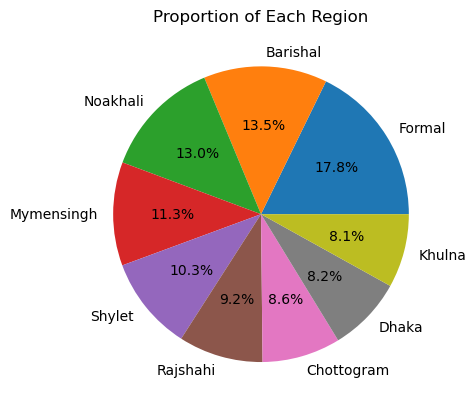

In [6]:
import matplotlib.pyplot as plt

# Plotting
df['Region'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Proportion of Each Region')
plt.ylabel('')  # Hide the y-label
plt.show()


In [7]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Load the DataFrame (assuming it's already loaded; otherwise, uncomment and adjust the line below)
# df = pd.read_csv('path_to_your_csv_file.csv')

# Check if 'df' is defined and contains the expected columns
if 'df' not in globals():
    raise ValueError("DataFrame 'df' is not defined. Please load the DataFrame.")

required_columns = ['Path', 'Region']
if not all(col in df.columns for col in required_columns):
    raise ValueError(f"DataFrame must contain the following columns: {required_columns}")

# Extract audio file paths and labels
audio_data = df['Path'].values
labels = df['Region'].values

# Validate file paths and filter out any invalid ones
valid_paths = [path for path in audio_data if os.path.exists(path)]
valid_labels = [labels[i] for i in range(len(audio_data)) if os.path.exists(audio_data[i])]

# Convert to numpy arrays
audio_data = np.array(valid_paths)
labels = np.array(valid_labels)

# Print shapes of arrays
print(f"Audio data shape: {audio_data.shape}")
print(f"Labels shape: {labels.shape}")

# Optionally, preview the first few entries
print("\nPreview of the first few audio file paths and labels:")
for i in range(min(5, len(audio_data))):
    print(f"Path: {audio_data[i]}, Label: {labels[i]}")


Audio data shape: (9303,)
Labels shape: (9303,)

Preview of the first few audio file paths and labels:
Path: C:\Users\towfi\Data Science\Thesis - Beyond Words\bangla_accent_voice_data\Barishal\br1.wav, Label: Barishal
Path: C:\Users\towfi\Data Science\Thesis - Beyond Words\bangla_accent_voice_data\Barishal\br10.wav, Label: Barishal
Path: C:\Users\towfi\Data Science\Thesis - Beyond Words\bangla_accent_voice_data\Barishal\br100.wav, Label: Barishal
Path: C:\Users\towfi\Data Science\Thesis - Beyond Words\bangla_accent_voice_data\Barishal\br1000.wav, Label: Barishal
Path: C:\Users\towfi\Data Science\Thesis - Beyond Words\bangla_accent_voice_data\Barishal\br1001.wav, Label: Barishal


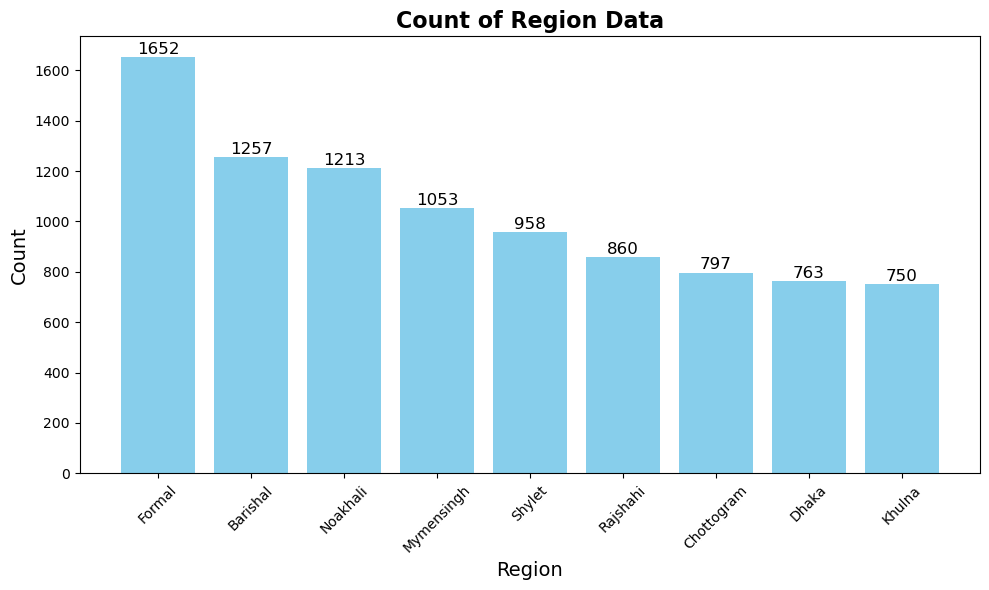

In [8]:
# Count occurrences of each class in 'Region'
class_counts = df['Region'].value_counts()

# Plot the class counts using a bar plot
plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(class_counts.index, class_counts.values, color='skyblue')  # Use color for aesthetics

# Add title and labels with improved styling
plt.title('Count of Region Data', size=16, fontweight='bold')
plt.xlabel('Region', size=14)
plt.ylabel('Count', size=14)

# Add value labels on top of the bars for better readability
for i, count in enumerate(class_counts):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom', fontsize=12)

# Show the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()       # Adjust layout to fit labels and titles
plt.show()


In [9]:
import matplotlib.pyplot as plt
import librosa
import librosa.display

def create_waveplot(data, sr, region_name):
    """
    Creates and displays a waveplot for the given audio data.

    Parameters:
    data (numpy.ndarray): Audio time series.
    sr (int): Sampling rate of the audio.
    region_name (str): Description of the audio region for the plot title.
    """
    try:
        plt.figure(figsize=(10, 3))
        plt.title(f'Waveplot for audio with {region_name} Region', size=15)
        librosa.display.waveshow(data, sr=sr)  # Updated to waveshow for newer versions of librosa
        plt.xlabel('Time')
        plt.ylabel('Amplitude')
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"An error occurred while creating the waveplot: {e}")

def create_spectrogram(data, sr, region_name):
    """
    Creates and displays a spectrogram for the given audio data.

    Parameters:
    data (numpy.ndarray): Audio time series.
    sr (int): Sampling rate of the audio.
    region_name (str): Description of the audio region for the plot title.
    """
    try:
        # Short-Time Fourier Transform
        X = librosa.stft(data)
        Xdb = librosa.amplitude_to_db(abs(X), ref=np.max)
        
        plt.figure(figsize=(12, 6))
        plt.title(f'Spectrogram for audio with {region_name} Region', size=15)
        librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')  # 'log' for better frequency resolution
        plt.colorbar(format='%+2.0f dB')
        plt.xlabel('Time')
        plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"An error occurred while creating the spectrogram: {e}")



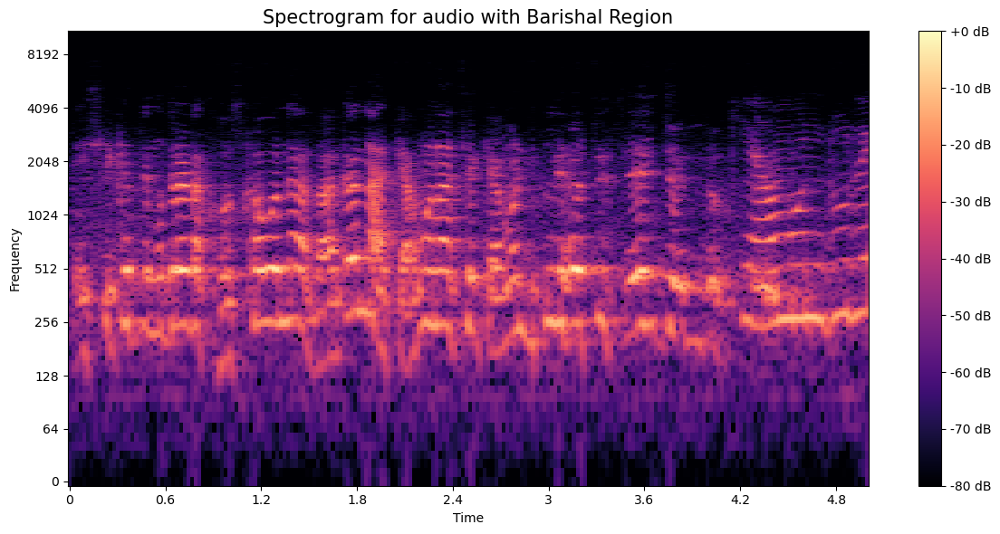

In [10]:
from IPython.display import Audio

# Assuming create_spectrogram function is already defined and imported

# Define region and get the path to the audio file
region = 'Barishal'
path = df.Path[df.Region == region].iloc[3]

# Load the audio file
data, sampling_rate = librosa.load(path)

# Create and display the spectrogram
create_spectrogram(data, sampling_rate, region)

# Display the audio player
Audio(path)


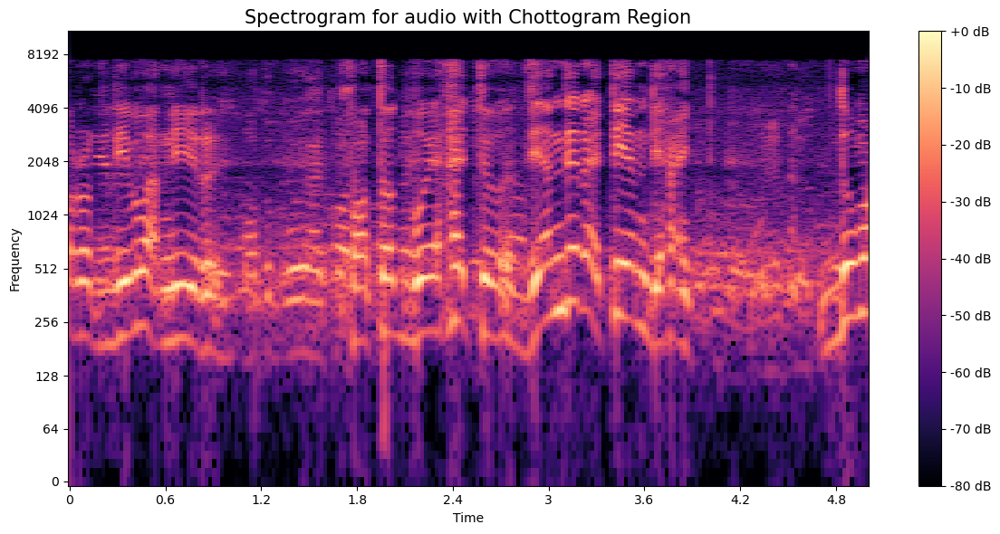

In [11]:
# Define region and get the path to the audio file
region = 'Chottogram'
path = df.Path[df.Region == region].iloc[3]

# Load the audio file
data, sampling_rate = librosa.load(path)

# Create and display the spectrogram
create_spectrogram(data, sampling_rate, region)

# Display the audio player
Audio(path)


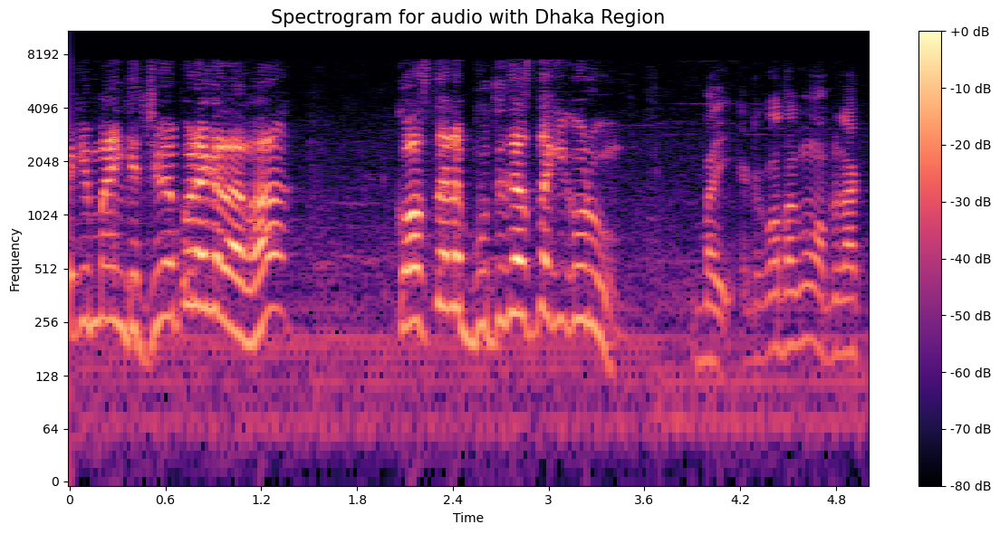

In [12]:
# Define region and get the path to the audio file
region = 'Dhaka'
path = df.Path[df.Region == region].iloc[3]

# Load the audio file
data, sampling_rate = librosa.load(path)

# Create and display the spectrogram
create_spectrogram(data, sampling_rate, region)

# Display the audio player
Audio(path)


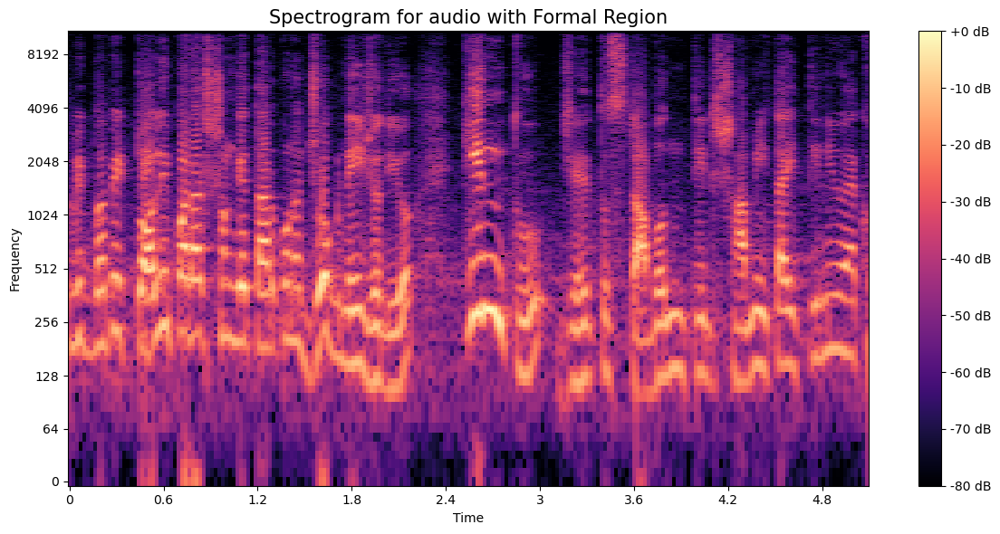

In [13]:
# Define region and get the path to the audio file
region = 'Formal'
path = df.Path[df.Region == region].iloc[3]

# Load the audio file
data, sampling_rate = librosa.load(path)

# Create and display the spectrogram
create_spectrogram(data, sampling_rate, region)

# Display the audio player
Audio(path)


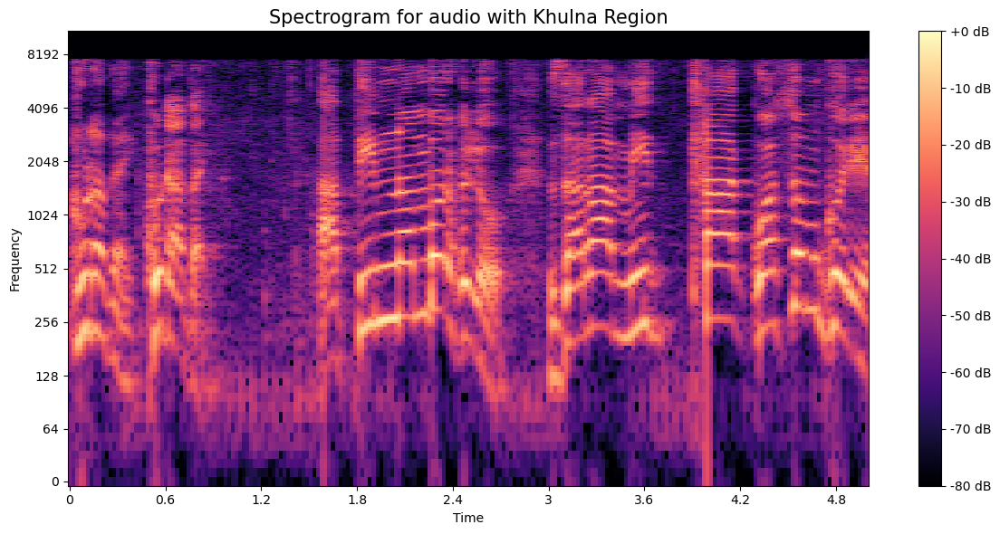

In [14]:
# Define region and get the path to the audio file
region = 'Khulna'
path = df.Path[df.Region == region].iloc[3]

# Load the audio file
data, sampling_rate = librosa.load(path)

# Create and display the spectrogram
create_spectrogram(data, sampling_rate, region)

# Display the audio player
Audio(path)


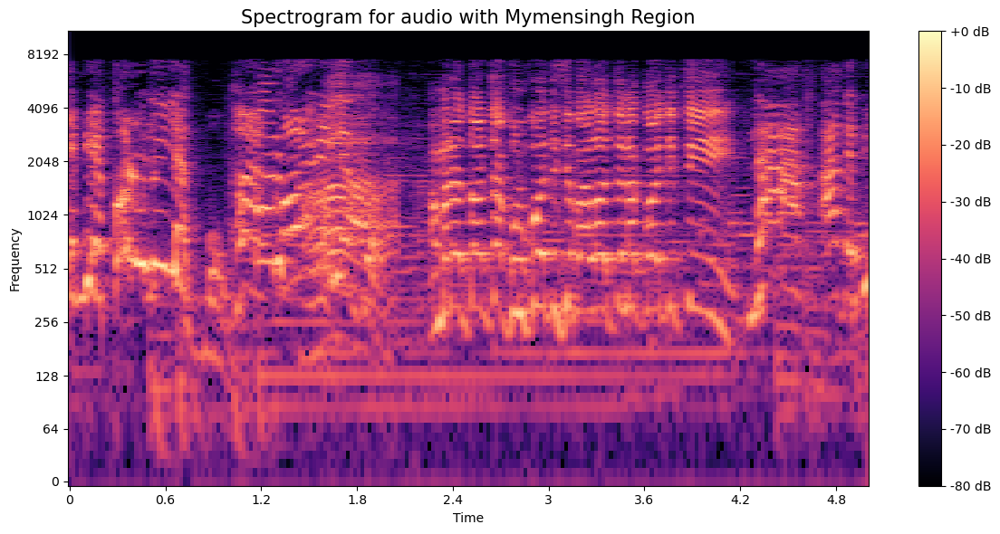

In [15]:
# Define region and get the path to the audio file
region = 'Mymensingh'
path = df.Path[df.Region == region].iloc[3]

# Load the audio file
data, sampling_rate = librosa.load(path)

# Create and display the spectrogram
create_spectrogram(data, sampling_rate, region)

# Display the audio player
Audio(path)


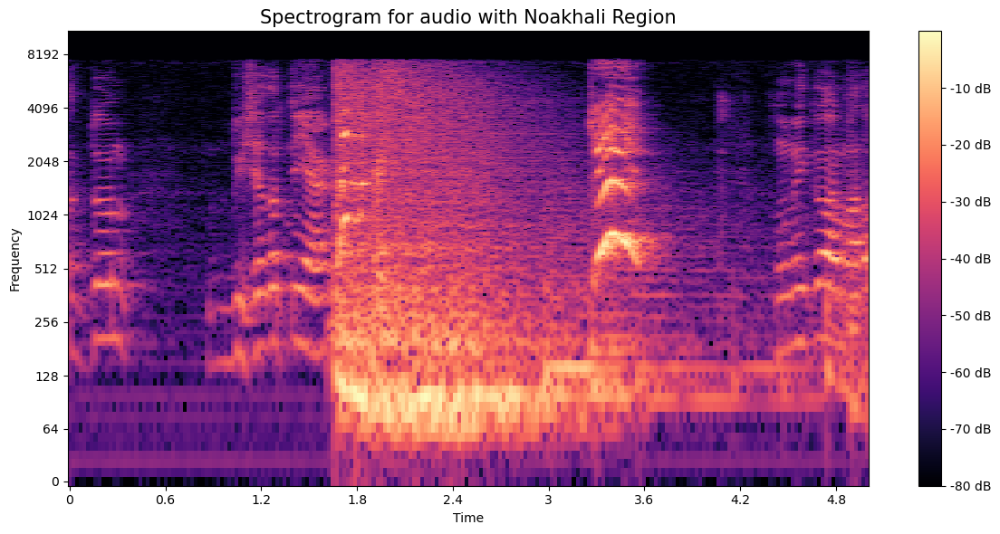

In [16]:
# Define region and get the path to the audio file
region = 'Noakhali'
path = df.Path[df.Region == region].iloc[3]

# Load the audio file
data, sampling_rate = librosa.load(path)

# Create and display the spectrogram
create_spectrogram(data, sampling_rate, region)

# Display the audio player
Audio(path)


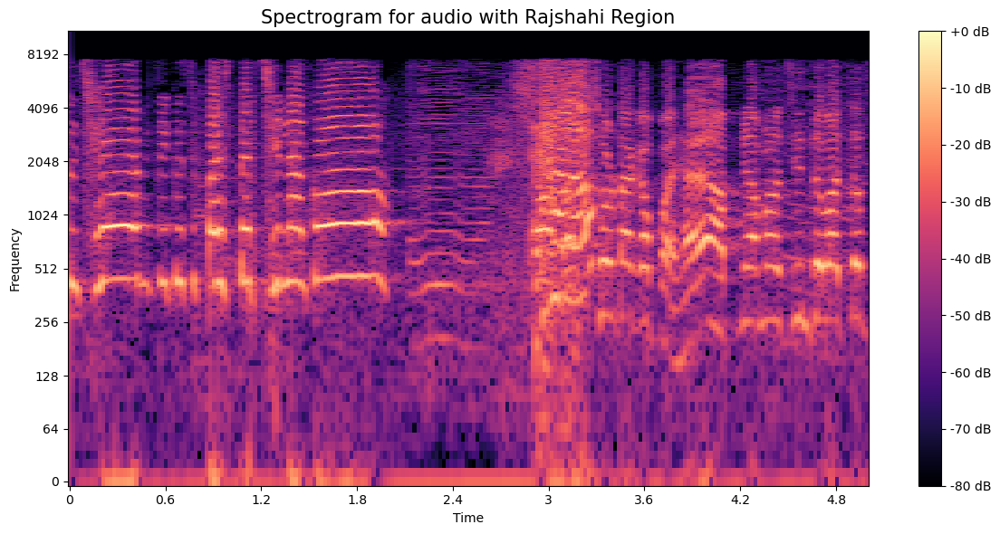

In [17]:
# Define region and get the path to the audio file
region = 'Rajshahi'
path = df.Path[df.Region == region].iloc[3]

# Load the audio file
data, sampling_rate = librosa.load(path)

# Create and display the spectrogram
create_spectrogram(data, sampling_rate, region)

# Display the audio player
Audio(path)


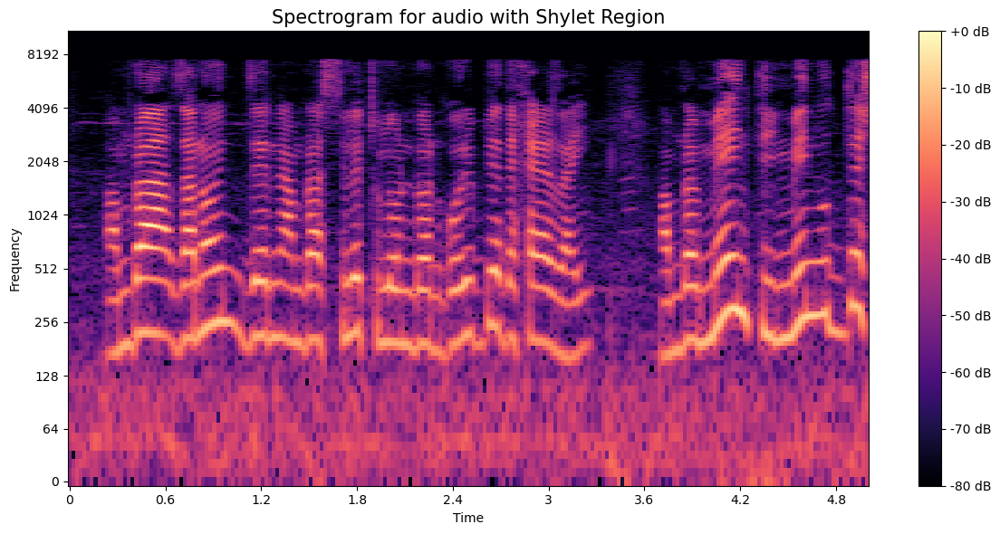

In [18]:
# Define region and get the path to the audio file
region = 'Shylet'
path = df.Path[df.Region == region].iloc[3]

# Load the audio file
data, sampling_rate = librosa.load(path)

# Create and display the spectrogram
create_spectrogram(data, sampling_rate, region)

# Display the audio player
Audio(path)


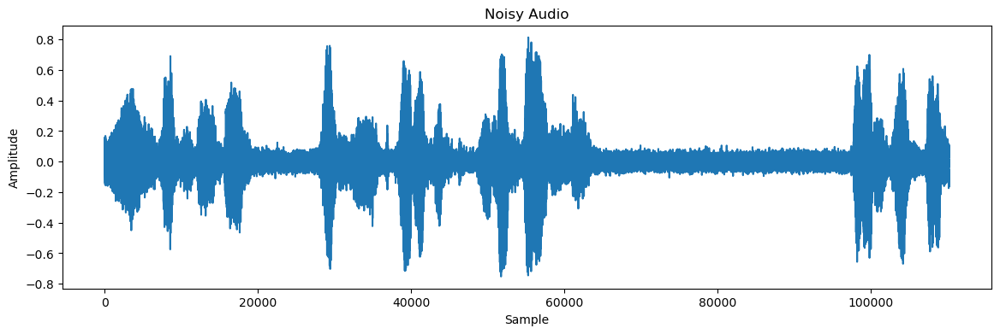

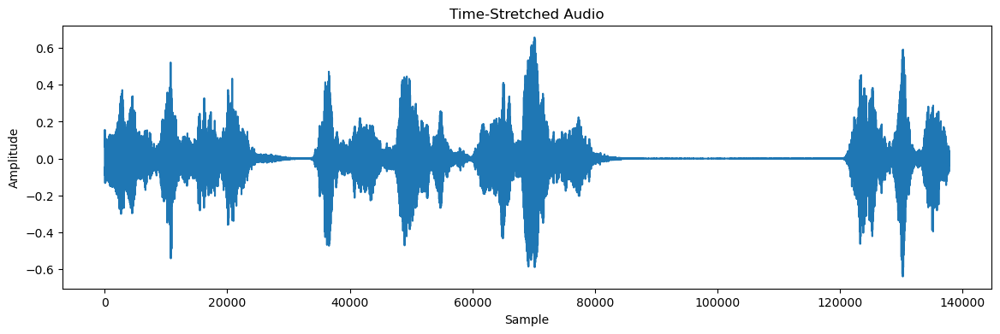

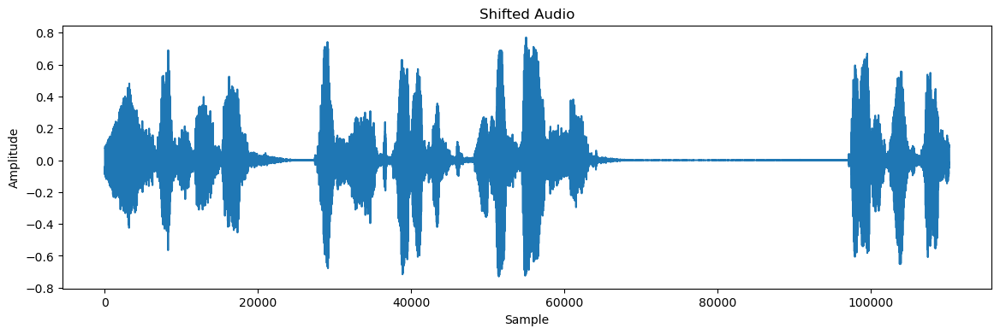

In [19]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
from sklearn import metrics

def add_noise(data, noise_level=0.035):
    noise_amp = noise_level * np.random.uniform() * np.amax(data)
    noise = noise_amp * np.random.normal(size=data.shape)
    return data + noise

def time_stretch(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate=rate)

def shift_audio(data, shift_max=5):
    shift_range = int(np.random.uniform(low=-shift_max, high=shift_max) * 1000)
    return np.roll(data, shift_range)

def pitch_shift(data, sampling_rate, n_steps=0.7):
    return librosa.effects.pitch_shift(data, sr=sampling_rate, n_steps=n_steps)

def plot_and_play(data, sample_rate, title):
    plt.figure(figsize=(14, 4))
    plt.plot(data)
    plt.title(title)
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')
    plt.show()
    display(Audio(data, rate=sample_rate))

def preprocess_and_augment_audio(path, augmentation=True):
    try:
        data, sample_rate = librosa.load(path)
        
        if augmentation:
            # Apply noise
            noisy_data = add_noise(data)
            plot_and_play(noisy_data, sample_rate, 'Noisy Audio')
            
            # Apply time stretch
            stretched_data = time_stretch(data)
            plot_and_play(stretched_data, sample_rate, 'Time-Stretched Audio')
            
            # Apply shift
            shifted_data = shift_audio(data)
            plot_and_play(shifted_data, sample_rate, 'Shifted Audio')
        
        return data, sample_rate
    except Exception as e:
        print(f"Error processing file {path}: {e}")
        return None, None

# Assuming df is a DataFrame with a 'Path' column
path = df.Path[1]
data, sample_rate = preprocess_and_augment_audio(path)


In [20]:
import numpy as np
import librosa
import pandas as pd
from tqdm import tqdm

def extract_features(data, sample_rate):
    features = []

    # Zero Crossing Rate
    zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    features.append(zcr)

    # Chroma STFT
    stft = np.abs(librosa.stft(data))
    chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
    features.append(chroma_stft)

    # MFCC
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate).T, axis=0)
    features.append(mfcc)

    # Root Mean Square Value
    rms = np.mean(librosa.feature.rms(y=data).T, axis=0)
    features.append(rms)

    # Mel Spectrogram
    mel = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    features.append(mel)

    return np.hstack(features)

def get_features(path):
    try:
        # Load audio file
        data, sample_rate = librosa.load(path, duration=2.5, offset=0.6)
    except Exception as e:
        print(f"Error loading audio file '{path}': {e}")
        return None

    features_list = []

    # Extract features without augmentation
    features_list.append(extract_features(data, sample_rate))

    # Apply augmentations and extract features
    augmentation_functions = [
        (add_noise, "Error adding noise: "),
        (time_stretch, "Error time stretching audio: "),
        (pitch_shift, "Error pitch shifting audio: ")
    ]

    for func, error_msg in augmentation_functions:
        try:
            augmented_data = func(data, sample_rate) if func == pitch_shift else func(data)
            features_list.append(extract_features(augmented_data, sample_rate))
        except Exception as e:
            print(f"{error_msg}{e}")

    return np.vstack(features_list) if features_list else None

# Initialize lists for features and labels
X, Y = [], []
total_files = len(df)

# Use tqdm to show progress bar with additional information
with tqdm(total=total_files, desc="Processing files") as pbar:
    for idx, (path, region) in enumerate(zip(df.Path, df.Region), start=1):
        feature = get_features(path)
        if feature is not None:
            num_features = feature.shape[0]
            X.extend(feature)
            Y.extend([region] * num_features)
            # Update progress bar with detailed information
            pbar.set_postfix({
                'File': path,
                'Features': num_features,
                'Total': len(X)
            })
        # Update progress bar
        pbar.update(1)

# Convert lists to numpy arrays
X = np.array(X)
Y = np.array(Y)

print(f"Feature extraction complete. Total features: {len(X)}")


Processing files: 100%|██████████| 9303/9303 [24:50<00:00,  6.24it/s, File=C:\Users\towfi\Data Science\Thesis - Beyond Words\bangla_accent_voice_data\Shylet\shlt99.wav, Features=4, Total=37212]                                                                                                                                 


Feature extraction complete. Total features: 37212


In [21]:
# Basic statistics
x_len = len(X)
y_len = len(Y)
path_shape = df.Path.shape

# Additional insights
x_y_match = "Match" if x_len == y_len else "Mismatch"
unique_paths = df.Path.nunique()

# Display the information
print(f"Length of X: {x_len}, Length of Y: {y_len} -> {x_y_match}")
print(f"Shape of df.Path: {path_shape}, Unique Paths: {unique_paths}")


Length of X: 37212, Length of Y: 37212 -> Match
Shape of df.Path: (9303,), Unique Paths: 9303


Summary Statistics:

                0             1             2             3             4    \
count  37212.000000  37212.000000  37212.000000  37212.000000  37212.000000   
mean       0.116065      0.556814      0.557417      0.559216      0.564025   
std        0.059531      0.107315      0.108011      0.109774      0.111767   
min        0.002993      0.053204      0.048221      0.052853      0.053280   
25%        0.076844      0.486100      0.484961      0.484929      0.488299   
50%        0.100431      0.557461      0.558007      0.558600      0.562050   
75%        0.135661      0.629332      0.629425      0.633049      0.639197   
max        0.630959      0.950967      0.959412      0.954607      0.982990   

                5             6             7             8             9    \
count  37212.000000  37212.000000  37212.000000  37212.000000  37212.000000   
mean       0.567156      0.557550      0.551694      0.553871      0.556856   
std        0.111835      0.106

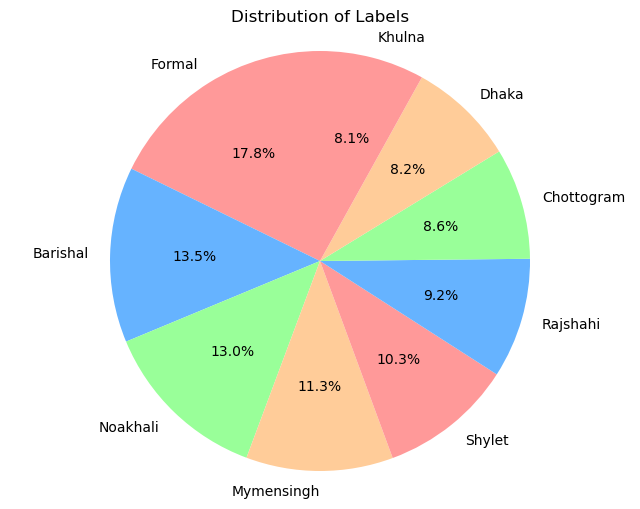

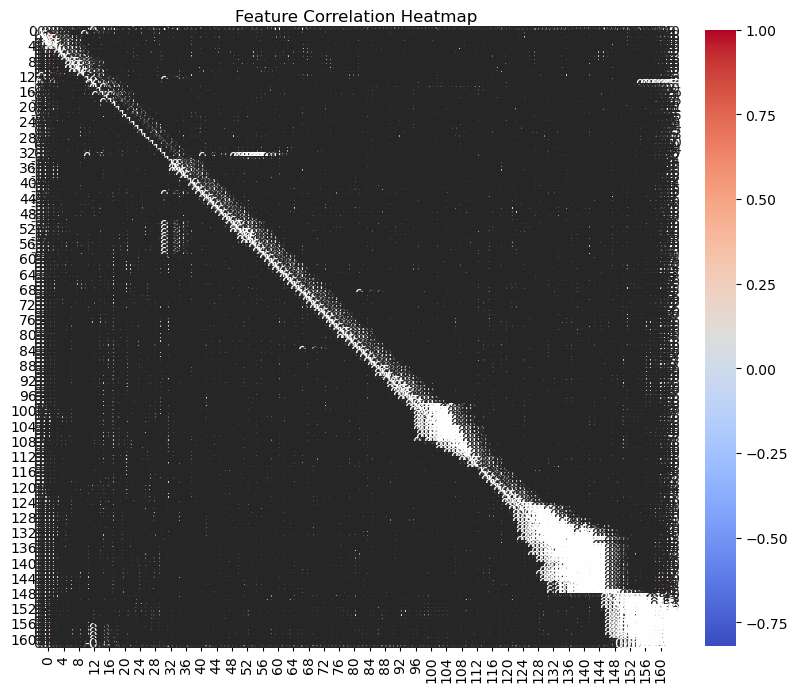

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Create a DataFrame from X and Y
Features = pd.DataFrame(X)  # If X already has meaningful column names, this step can stay as is
Features['labels'] = Y

# Display some basic statistics about the features
print("Summary Statistics:\n")
print(Features.describe())

# Check for missing values and give an alert
missing_values = Features.isnull().sum().sum()  # Total missing values
if missing_values > 0:
    print(f"\nWarning: Dataset contains {missing_values} missing values.")
else:
    print("\nNo missing values in the dataset.")

# Save to CSV
Features.to_csv('features.csv', index=False)
print("\nFeatures saved to 'features.csv'")

# Display the first few rows
print("\nFirst 5 rows of the dataset:")
print(Features.head())

# Visualization of label distribution: Pie Chart
label_counts = Features['labels'].value_counts()

# Plot a pie chart
plt.figure(figsize=(8, 6))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=90, colors=['#ff9999','#66b3ff','#99ff99','#ffcc99'])
plt.title('Distribution of Labels')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular.
plt.show()

# Optional: Correlation heatmap between features
# Filter out non-numeric columns from the DataFrame
numeric_features = Features.select_dtypes(include=[float, int])

# Check if there are any numeric columns
if not numeric_features.empty:
    # Plot correlation heatmap
    plt.figure(figsize=(10, 8))
    correlation_matrix = numeric_features.corr()  # Compute correlation between numeric features
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('Feature Correlation Heatmap')
    plt.show()
else:
    print("No numeric features available for correlation analysis.")


In [43]:
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split

# Extract features and target variables
X = Features.iloc[:, :-1].values  # Feature matrix
Y = Features['labels'].values  # Target variable

# One-hot encode the target labels
encoder = OneHotEncoder(sparse_output=False)  # Use sparse_output=False for dense output
Y_encoded = encoder.fit_transform(Y.reshape(-1, 1))  # Reshape for encoder

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the standardized data
X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y_encoded, test_size=0.20, random_state=0, shuffle=True)

# Output shapes of the training and testing sets
print("Feature matrix shape:", X.shape)
print("Encoded target shape:", Y_encoded.shape)
print("Training feature matrix shape:", X_train.shape)
print("Training target shape:", Y_train.shape)
print("Testing feature matrix shape:", X_test.shape)
print("Testing target shape:", Y_test.shape)


Feature matrix shape: (37212, 162)
Encoded target shape: (37212, 9)
Training feature matrix shape: (29769, 162)
Training target shape: (29769, 9)
Testing feature matrix shape: (7443, 162)
Testing target shape: (7443, 9)


In [45]:
# Reshape data to be compatible with models expecting 3D input
X_train_reshaped = np.expand_dims(X_train, axis=2)
X_test_reshaped = np.expand_dims(X_test, axis=2)

# Output shapes of the training and testing sets after reshaping
print("Original training feature matrix shape:", X_train.shape)
print("Original testing feature matrix shape:", X_test.shape)
print("Reshaped training feature matrix shape:", X_train_reshaped.shape)
print("Reshaped testing feature matrix shape:", X_test_reshaped.shape)
print("Training target shape:", Y_train.shape)
print("Testing target shape:", Y_test.shape)

Original training feature matrix shape: (29769, 162)
Original testing feature matrix shape: (7443, 162)
Reshaped training feature matrix shape: (29769, 162, 1)
Reshaped testing feature matrix shape: (7443, 162, 1)
Training target shape: (29769, 9)
Testing target shape: (7443, 9)


In [47]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, Activation, BatchNormalization, Input
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Input layer
inputs = Input(shape=(X_train_reshaped.shape[1],))

# First hidden layer
x = Dense(100)(inputs)
x = Activation('relu')(x)
x = Dropout(0.1)(x)

# Second hidden layer
x = Dense(200)(x)
x = Activation('relu')(x)
x = Dropout(0.1)(x)

# Third hidden layer
x = Dense(300)(x)
x = Activation('relu')(x)
x = Dropout(0.1)(x)

# Fourth hidden layer (formerly Flatten layer)
x = Dense(42)(x)  # Change the number of units to match original model

# Output layer
outputs = Dense(9, activation='softmax')(x)

# Create the model
model = Model(inputs=inputs, outputs=outputs)

# Compile the model
model.compile(optimizer=Adam(), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

# Model summary
model.summary()

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', 
                      factor=0.5, 
                      patience=5, 
                      min_lr=1e-6, 
                      verbose=1),
    ModelCheckpoint('best_model.keras',  # Updated to .keras extension
                    save_best_only=True, 
                    monitor='val_loss', 
                    mode='min', 
                    verbose=1)
]


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 162)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 100)            │        16,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_6 (Activation)       │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 200)            │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_7 (Activation)       │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 300)            │        60,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_8 (Activation)       │ (None, 300)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 300)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 42)             │        12,642 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 9)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 109,829 (429.02 KB)

 Trainable params: 109,829 (429.02 KB)

 Non-trainable params: 0 (0.00 B)

In [49]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, Activation, Input
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Input layer
inputs = Input(shape=(X_train_reshaped.shape[1],))

# First hidden layer
x = Dense(100)(inputs)
x = Activation('relu')(x)
x = Dropout(0.1)(x)

# Second hidden layer
x = Dense(200)(x)
x = Activation('relu')(x)
x = Dropout(0.1)(x)

# Third hidden layer
x = Dense(300)(x)
x = Activation('relu')(x)
x = Dropout(0.1)(x)

# Fourth hidden layer
x = Dense(100)(x)
x = Dropout(0.5)(x)

# Additional hidden layers (from multiple Flatten layers)
x = Dense(100)(x)
x = Dropout(0.5)(x)

x = Dense(100)(x)
x = Dropout(0.5)(x)

x = Dense(100)(x)
x = Dropout(0.5)(x)

# Output layer
outputs = Dense(9, activation='softmax')(x)

# Create the model
model = Model(inputs=inputs, outputs=outputs)

# Compile the model
model.compile(optimizer=Adam(), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

# Model summary
model.summary()

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', 
                      factor=0.5, 
                      patience=5, 
                      min_lr=1e-6, 
                      verbose=1),
    ModelCheckpoint('best_model.keras',  # Updated to .keras extension
                    save_best_only=True, 
                    monitor='val_loss', 
                    mode='min', 
                    verbose=1)
]


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 162)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 100)            │        16,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_9 (Activation)       │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 200)            │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_10 (Activation)      │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 300)            │        60,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_11 (Activation)      │ (None, 300)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 300)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 100)            │        30,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 9)              │           909 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 158,109 (617.61 KB)

 Trainable params: 158,109 (617.61 KB)

 Non-trainable params: 0 (0.00 B)

In [57]:
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.5, verbose=0, patience=2, min_lr=0.0000001)
history=model.fit(X_train_reshaped, Y_train, batch_size=64, epochs=100, validation_data=(X_test_reshaped, Y_test), callbacks=[rlrp])

Epoch 1/100
466/466 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.2750 - loss: 2.0629 - val_accuracy: 0.5913 - val_loss: 1.1803 - learning_rate: 0.0010
Epoch 2/100
466/466 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5528 - loss: 1.2816 - val_accuracy: 0.6616 - val_loss: 0.9557 - learning_rate: 0.0010
Epoch 3/100
466/466 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6280 - loss: 1.0768 - val_accuracy: 0.7207 - val_loss: 0.8116 - learning_rate: 0.0010
Epoch 4/100
466/466 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6864 - loss: 0.9315 - val_accuracy: 0.7584 - val_loss: 0.7249 - learning_rate: 0.0010
Epoch 5/100
466/466 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7162 - loss: 0.8582 - val_accuracy: 0.7787 - val_loss: 0.6903 - learning_rate: 0.0010
Epoch 6/100
466/466 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7419 - loss: 0.7916 - val_accuracy: 0.8042 - val_loss: 0.6104 - learning_rate: 0.0010
Epoch 7/100
466/466 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7606 - loss: 0.

233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - accuracy: 0.9430 - loss: 0.2413
Accuracy of our model on test data :  94.23619508743286 %


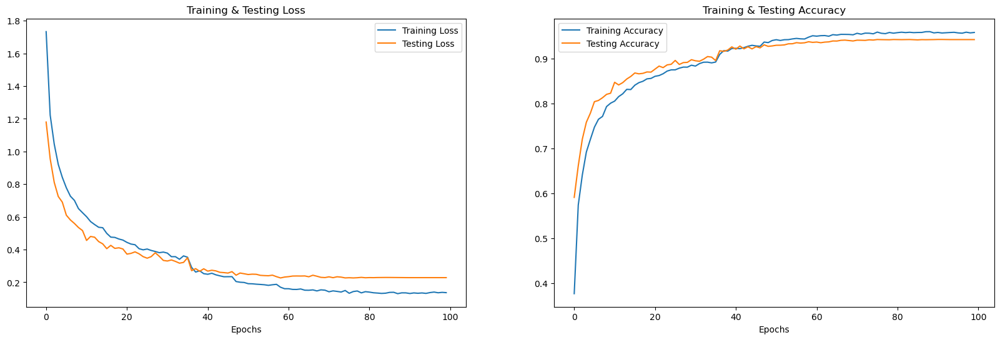

In [59]:
print("Accuracy of our model on test data : " , model.evaluate(X_test_reshaped, Y_test)[1]*100 , "%")

epochs = [i for i in range(100)]
fig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
test_acc = history.history['val_accuracy']
test_loss = history.history['val_loss']

fig.set_size_inches(20,6)
ax[0].plot(epochs , train_loss , label = 'Training Loss')
ax[0].plot(epochs , test_loss , label = 'Testing Loss')
ax[0].set_title('Training & Testing Loss')
ax[0].legend()
ax[0].set_xlabel("Epochs")

ax[1].plot(epochs , train_acc , label = 'Training Accuracy')
ax[1].plot(epochs , test_acc , label = 'Testing Accuracy')
ax[1].set_title('Training & Testing Accuracy')
ax[1].legend()
ax[1].set_xlabel("Epochs")
plt.show()

In [63]:
# predicting on test data.
pred_test = model.predict(X_test_reshaped)
y_pred = encoder.inverse_transform(pred_test)

y_test1 = encoder.inverse_transform(Y_test)

233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


In [65]:
df = pd.DataFrame(columns=['Predicted Labels', 'Actual Labels'])
df['Predicted Labels'] = y_pred.flatten()
df['Actual Labels'] = y_test1.flatten()

df.tail(20)

,Predicted Labels,Actual Labels
7423,Shylet,Shylet
7424,Shylet,Shylet
7425,Shylet,Shylet
7426,Mymensingh,Mymensingh
7427,Noakhali,Noakhali
7428,Barishal,Barishal
7429,Formal,Formal
7430,Rajshahi,Rajshahi
7431,Noakhali,Noakhali
7432,Mymensingh,Mymensingh


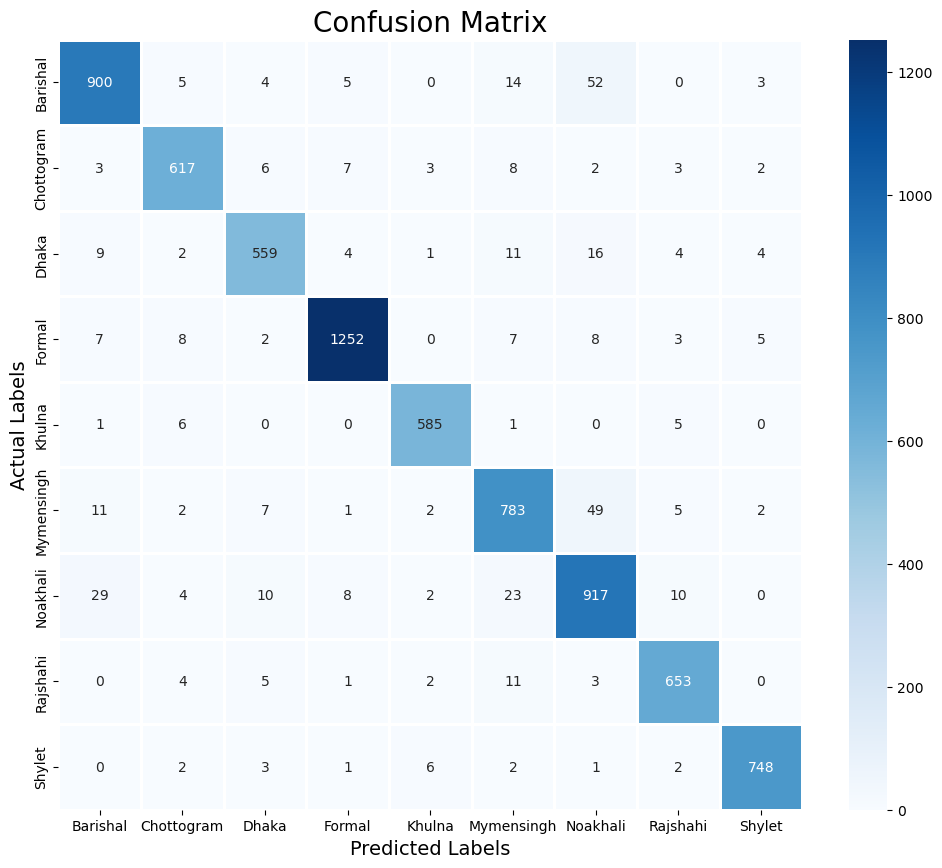

In [69]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test1, y_pred)
plt.figure(figsize = (12, 10))
cm = pd.DataFrame(cm , index = [i for i in encoder.categories_] , columns = [i for i in encoder.categories_])
sns.heatmap(cm, linecolor='white', cmap='Blues', linewidth=1, annot=True, fmt='')
plt.title('Confusion Matrix', size=20)
plt.xlabel('Predicted Labels', size=14)
plt.ylabel('Actual Labels', size=14)
plt.show()

In [73]:
from sklearn.metrics import classification_report
print(classification_report(y_test1, y_pred))

              precision    recall  f1-score   support

    Barishal       0.94      0.92      0.93       983
  Chottogram       0.95      0.95      0.95       651
       Dhaka       0.94      0.92      0.93       610
      Formal       0.98      0.97      0.97      1292
      Khulna       0.97      0.98      0.98       598
  Mymensingh       0.91      0.91      0.91       862
    Noakhali       0.88      0.91      0.89      1003
    Rajshahi       0.95      0.96      0.96       679
      Shylet       0.98      0.98      0.98       765

    accuracy                           0.94      7443
   macro avg       0.94      0.94      0.94      7443
weighted avg       0.94      0.94      0.94      7443

